# Homework 6 - Generative Adversarial Network
This is the sample code for hw6 of 2022 Machine Learning course in National Taiwan University. 

In this sample code, there are 5 sections:
1. Environment setting
2. Dataset preparation
3. Model setting
4. Train
5. Inference

Your goal is to do anime face generation, if you have any question, please discuss at NTU COOL 

# Environment setting
In this section, we will prepare for the dataset and set some environment variable

## Download Dataset

In [1]:
# # get dataset from huggingface hub
# !curl -s https://packagecloud.io/install/repositories/github/git-lfs/script.deb.sh | bash
# !apt-get install git-lfs
# !git lfs install
# !git clone https://huggingface.co/datasets/LeoFeng/MLHW_6
# !unzip ./MLHW_6/faces.zip -d .

# # import subprocess
# import os
# import zipfile

# # 下载并安装 Git LFS
# # subprocess.run(["powershell", "-Command", "Invoke-WebRequest -Uri https://packagecloud.io/install/repositories/github/git-lfs/script.ps1 -OutFile script.ps1"])
# # subprocess.run(["powershell", "-Command", "Set-ExecutionPolicy -Scope Process -ExecutionPolicy Bypass; .\\script.ps1"])
# # subprocess.run(["powershell", "-Command", "choco install git-lfs -y"])
# # subprocess.run(["git", "lfs", "install"])

# # # 克隆 Git 仓库
# # subprocess.run(["git", "clone", "https://huggingface.co/datasets/LeoFeng/MLHW_6"])

# # 解压缩 faces.zip 文件
# with zipfile.ZipFile("./MLHW_6/faces.zip", 'r') as zip_ref:
#     zip_ref.extractall(".")

## Other setting

In [2]:
# import module
import os
import glob
import random
from datetime import datetime

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch import optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt
import numpy as np
import logging
from tqdm import tqdm


# seed setting
def same_seeds(seed):
    # Python built-in random module
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

same_seeds(2022)
workspace_dir = '.'
load_time = None

# Dataset preparation
In this section, we prepare for the dataset for Pytorch

## Create dataset for Pytorch

In order to unified image information, we use the transform function to:
1. Resize image to 64x64
2. Normalize the image

This CrypkoDataset class will be use in Section 4

In [3]:
# prepare for CrypkoDataset

class CrypkoDataset(Dataset):
    def __init__(self, fnames, transform):
        self.transform = transform
        self.fnames = fnames
        self.num_samples = len(self.fnames)

    def __getitem__(self,idx):
        fname = self.fnames[idx]
        img = torchvision.io.read_image(fname)
        img = self.transform(img)
        return img

    def __len__(self):
        return self.num_samples

def get_dataset(root):
    fnames = glob.glob(os.path.join(root, '*'))
    compose = [
        transforms.ToPILImage(),
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ]
    transform = transforms.Compose(compose)
    dataset = CrypkoDataset(fnames, transform)
    return dataset

## Show the image
Show some sample in the dataset

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.85882354..1.0].


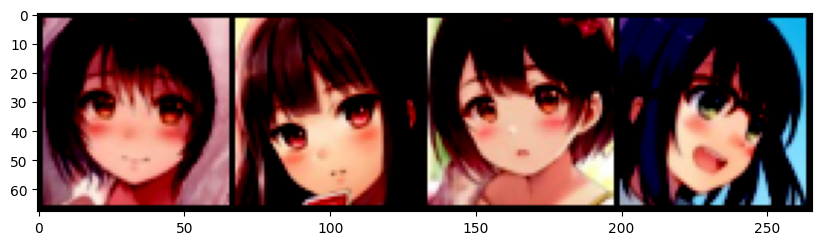

In [4]:
temp_dataset = get_dataset(os.path.join(workspace_dir, 'faces'))

images = [temp_dataset[i] for i in range(4)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

# Model setting
In this section, we will create models and trainer.

## Create model
In this section, we will create models for Generator and Discriminator

In [5]:
# setting for weight init function
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [6]:
# Generator

class Generator(nn.Module):
    """
    Input shape: (batch, in_dim)
    Output shape: (batch, 3, 64, 64)
    """
    def __init__(self, in_dim, feature_dim=64):
        super().__init__()
    
        #input: (batch, 100)
        self.l1 = nn.Sequential(
            nn.Linear(in_dim, feature_dim * 8 * 4 * 4, bias=False),
            nn.BatchNorm1d(feature_dim * 8 * 4 * 4),
            nn.ReLU()
        )
        
        self.l2 = nn.Sequential(
            self.dconv_bn_relu(feature_dim * 8, feature_dim * 4),               #(batch, feature_dim * 4, 8, 8)     
            self.dconv_bn_relu(feature_dim * 4, feature_dim * 2),               #(batch, feature_dim * 2, 16, 16)     
            self.dconv_bn_relu(feature_dim * 2, feature_dim),                   #(batch, feature_dim , 32, 32)     
        )
        self.l3 = nn.Sequential(
            nn.ConvTranspose2d(feature_dim, 3, kernel_size=5, stride=2,
                               padding=2, output_padding=1, bias=False),
            nn.Tanh()   
        )
        
        self.apply(weights_init)

    def dconv_bn_relu(self, in_dim, out_dim):
        return nn.Sequential(
            nn.ConvTranspose2d(in_dim, out_dim, kernel_size=5, stride=2,
                               padding=2, output_padding=1, bias=False),        #double height and width
            nn.BatchNorm2d(out_dim),
            nn.ReLU(True)
        )
    def forward(self, x):
        y = self.l1(x)
        y = y.view(y.size(0), -1, 4, 4)
        y = self.l2(y)
        y = self.l3(y)
        return y

In [7]:
# Discriminator
class Discriminator(nn.Module):
    """
    Input shape: (batch, 3, 64, 64)
    Output shape: (batch)
    """
    def __init__(self, in_dim, feature_dim=64):
        super(Discriminator, self).__init__()
            
        #input: (batch, 3, 64, 64)
        """
        NOTE FOR SETTING DISCRIMINATOR:

        Remove last sigmoid layer for WGAN
        """
        self.l1 = nn.Sequential(
            nn.Conv2d(in_dim, feature_dim, kernel_size=4, stride=2, padding=1), #(batch, feature_dim, 32, 32)
            nn.LeakyReLU(0.2),
            self.conv_bn_lrelu(feature_dim, feature_dim * 2),                   #(batch, feature_dim*2, 16, 16)
            self.conv_bn_lrelu(feature_dim * 2, feature_dim * 4),               #(batch, feature_dim*4, 8, 8)
            self.conv_bn_lrelu(feature_dim * 4, feature_dim * 8),               #(batch, feature_dim*8, 4, 4)
            nn.Conv2d(feature_dim * 8, 1, kernel_size=4, stride=1, padding=0),  #(batch, 1, 1,1)
            # nn.Sigmoid(),
        )
        self.apply(weights_init)
    def conv_bn_lrelu(self, in_dim, out_dim):
        """
        NOTE FOR SETTING DISCRIMINATOR:

        You can't use nn.Batchnorm for WGAN-GP
        Use nn.InstanceNorm2d instead
        """

        return nn.Sequential(
            nn.Conv2d(in_dim, out_dim, 4, 2, 1),
            nn.InstanceNorm2d(out_dim),
            nn.LeakyReLU(0.2),
        )
    def forward(self, x):
        y = self.l1(x)
        y = y.view(-1)
        return y

## Create trainer
In this section, we will create a trainer which contains following functions:
1. prepare_environment: prepare the overall environment, construct the models, create directory for the log and ckpt
2. train: train for generator and discriminator, you can try to modify the code here to construct WGAN or WGAN-GP
3. inference: after training, you can pass the generator ckpt path into it and the function will save the result for you

In [8]:
import torch.autograd as autograd

class TrainerGAN():
    def __init__(self, config):
        self.config = config
        
        self.G = Generator(100)
        self.D = Discriminator(3)
        
        self.loss = nn.BCELoss()

        """
        NOTE FOR SETTING OPTIMIZER:

        GAN: use Adam optimizer
        WGAN: use RMSprop optimizer
        WGAN-GP: use Adam optimizer 
        """
        self.opt_D = torch.optim.Adam(self.D.parameters(), lr=self.config["lr"], betas=(0.5, 0.999))
        self.opt_G = torch.optim.Adam(self.G.parameters(), lr=self.config["lr"], betas=(0.5, 0.999))
        
        self.dataloader = None
        self.log_dir = os.path.join(self.config["workspace_dir"], 'logs')
        self.ckpt_dir = os.path.join(self.config["workspace_dir"], 'checkpoints')
        
        FORMAT = '%(asctime)s - %(levelname)s: %(message)s'
        logging.basicConfig(level=logging.INFO, 
                            format=FORMAT,
                            datefmt='%Y-%m-%d %H:%M')
        
        self.steps = 0
        self.z_samples = Variable(torch.randn(100, self.config["z_dim"])).cuda()
        
    def prepare_environment(self):
        """
        Use this funciton to prepare function
        """
        os.makedirs(self.log_dir, exist_ok=True)
        os.makedirs(self.ckpt_dir, exist_ok=True)
        
        # update dir by time
        time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

        global load_time
        load_time = time
        self.log_dir = os.path.join(self.log_dir, time+f'_{self.config["model_type"]}')
        self.ckpt_dir = os.path.join(self.ckpt_dir, time+f'_{self.config["model_type"]}')
        os.makedirs(self.log_dir)
        os.makedirs(self.ckpt_dir)
        
        # create dataset by the above function
        dataset = get_dataset(os.path.join(self.config["workspace_dir"], 'faces'))
        self.dataloader = DataLoader(dataset, batch_size=self.config["batch_size"], shuffle=True, num_workers=0)
        
        # model preparation
        self.G = self.G.cuda()
        self.D = self.D.cuda()
        self.G.train()
        self.D.train()

    def gp(self,r_imgs, f_imgs):
        alpha = torch.cuda.FloatTensor(np.random.random((r_imgs.size(0), 1, 1, 1)))
        # Get random interpolation between real and fake samples
        interpolates = (alpha * r_imgs + ((1 - alpha) * f_imgs)).requires_grad_(True)
        d_interpolates = self.D(interpolates)
        fake = Variable(torch.cuda.FloatTensor(r_imgs.shape[0]).fill_(1.0), requires_grad=False)
        # Get gradient w.r.t. interpolates
        gradients = autograd.grad(
            outputs=d_interpolates,
            inputs=interpolates,
            grad_outputs=fake,
            create_graph=True,
            retain_graph=True,
            only_inputs=True,
        )[0]
        gradients = gradients.view(gradients.size(0), -1)
        gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
        return gradient_penalty
        
    def train(self):
        """
        Use this function to train generator and discriminator
        """
        self.prepare_environment()
        for e, epoch in enumerate(range(self.config["n_epoch"])):
            progress_bar = tqdm(self.dataloader)
            progress_bar.set_description(f"Epoch {e+1}")
            for i, data in enumerate(progress_bar):
                imgs = data
                bs = imgs.size(0)

                # *********************
                # *    Train D        *
                # *********************
                z = Variable(torch.randn(bs, self.config["z_dim"])).cuda()
                r_imgs = Variable(imgs).cuda()    # Real images
                f_imgs = self.G(z)                # Generate fake images


                # Discriminator forwarding
                r_logit = self.D(r_imgs)
                f_logit = self.D(f_imgs)

                """
                NOTE FOR SETTING DISCRIMINATOR LOSS:
                
                GAN: 
                    loss_D = (r_loss + f_loss)/2
                WGAN: 
                    loss_D = -torch.mean(r_logit) + torch.mean(f_logit)
                WGAN-GP: 
                    gradient_penalty = self.gp(r_imgs, f_imgs)
                    loss_D = -torch.mean(r_logit) + torch.mean(f_logit) + gradient_penalty
                """
                # Loss for discriminator
                # r_loss = self.loss(r_logit, r_label)
                # f_loss = self.loss(f_logit, f_label)
                # loss_D = (r_loss + f_loss) / 2
                # loss_D = -torch.mean(r_logit) + torch.mean(f_logit)

                gradient_penalty = self.gp(r_imgs, f_imgs)
                loss_D = -torch.mean(r_logit) + torch.mean(f_logit) + gradient_penalty

                # Discriminator backwarding 
                self.D.zero_grad()
                loss_D.backward()
                self.opt_D.step()

                # """
                # NOTE FOR SETTING WEIGHT CLIP:
                
                # WGAN: below code
                # """
                # for p in self.D.parameters():
                #     p.data.clamp_(-self.config["clip_value"], self.config["clip_value"])



                # # *********************
                # # *    Train G        *
                # # *********************
                if self.steps % self.config["n_critic"] == 0:
                    # Generate some fake images.
                    z = Variable(torch.randn(bs, self.config["z_dim"])).cuda()
                    f_imgs = self.G(z)

                    # Generator forwarding
                    f_logit = self.D(f_imgs)


                #     """
                #     NOTE FOR SETTING LOSS FOR GENERATOR:
                    
                #     GAN: loss_G = self.loss(f_logit, r_label)
                #     WGAN: loss_G = -torch.mean(self.D(f_imgs))
                #     WGAN-GP: loss_G = -torch.mean(self.D(f_imgs))
                #     """
                #     # Loss for the generator.
                    # loss_G = self.loss(f_logit, r_label)
                    loss_G = -torch.mean(self.D(f_imgs))

                    # Generator backwarding
                    self.G.zero_grad()
                    loss_G.backward()
                    self.opt_G.step()
                    
                if self.steps % 10 == 0:
                    progress_bar.set_postfix(loss_G=loss_G.item(), loss_D=loss_D.item())
                
                self.steps += 1

            self.G.eval()
            f_imgs_sample = (self.G(self.z_samples).data + 1) / 2.0
            filename = os.path.join(self.log_dir, f'Epoch_{epoch+1:03d}.jpg')
            torchvision.utils.save_image(f_imgs_sample, filename, nrow=10)
            logging.info(f'Save some samples to {filename}.')

            # Show some images during training.
            grid_img = torchvision.utils.make_grid(f_imgs_sample.cpu(), nrow=10)
            plt.figure(figsize=(10,10))
            plt.imshow(grid_img.permute(1, 2, 0))
            plt.show()

            self.G.train()

            if (e+1) % 5 == 0 or e == 0:
                # Save the checkpoints.
                torch.save(self.G.state_dict(), os.path.join(self.ckpt_dir, f'G_{e}.pth'))
                torch.save(self.D.state_dict(), os.path.join(self.ckpt_dir, f'D_{e}.pth'))

        logging.info('Finish training')

    def inference(self, G_path, n_generate=1000, n_output=30, show=False):
        """
        1. G_path is the path for Generator ckpt
        2. You can use this function to generate final answer
        """

        self.G.load_state_dict(torch.load(G_path))
        self.G.cuda()
        self.G.eval()
        z = Variable(torch.randn(n_generate, self.config["z_dim"])).cuda()
        imgs = (self.G(z).data + 1) / 2.0
        
        os.makedirs('output', exist_ok=True)
        for i in range(n_generate):
            torchvision.utils.save_image(imgs[i], f'output/{i+1}.jpg')
        
        if show:
            row, col = n_output//10 + 1, 10
            grid_img = torchvision.utils.make_grid(imgs[:n_output].cpu(), nrow=row)
            plt.figure(figsize=(row, col))
            plt.imshow(grid_img.permute(1, 2, 0))
            plt.show()

# Train
In this section, we will first set the config for trainer, then use it to train generator and discriminator

## Set config

In [9]:
config = {
    "model_type": "GAN",
    "batch_size": 64,
    "lr": 1e-4,
    "n_epoch": 10,
    "n_critic": 1,
    "z_dim": 100,
    "workspace_dir": workspace_dir, # define in the environment setting
    "clip_value": 1
}

## Start to train

Epoch 1:   0%|          | 0/1115 [00:00<?, ?it/s]C:\Users\admin\AppData\Local\Temp\ipykernel_7972\2388235257.py:62: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ..\torch\csrc\tensor\python_tensor.cpp:80.)
  alpha = torch.cuda.FloatTensor(np.random.random((r_imgs.size(0), 1, 1, 1)))
c:\Users\admin\.conda\envs\AI\Lib\site-packages\torch\autograd\graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
Epoch 1: 100%|██████████| 1115/1115 [04:47<00:00,  3.88it/s, loss_D=-20, loss_G=52.4]  
2024-10-23 10:47 - INFO: Save some samples to .\logs\2024

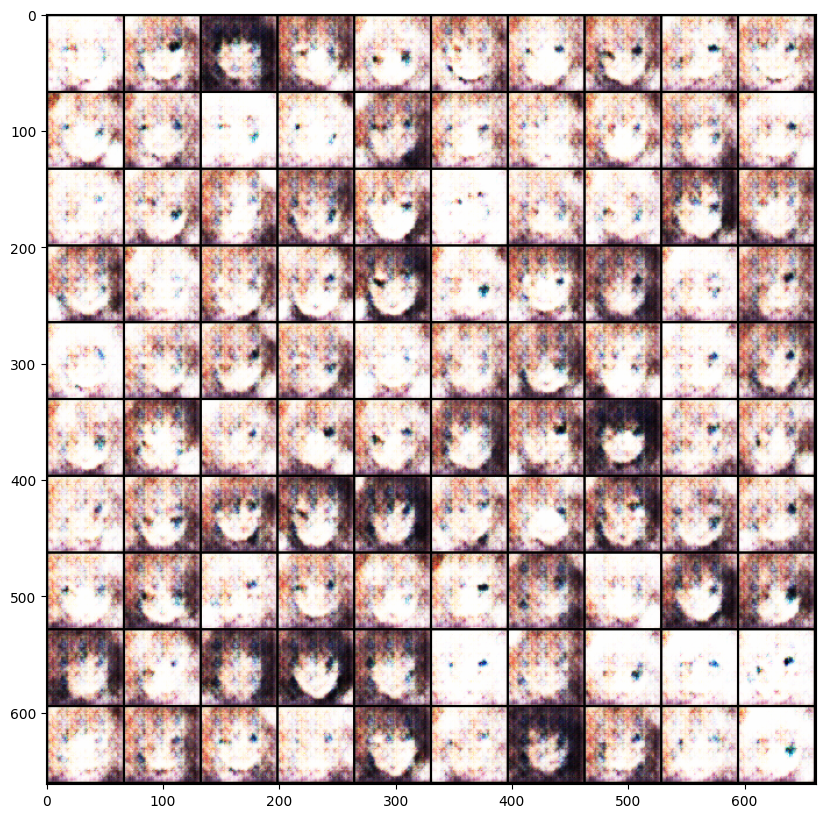

Epoch 2: 100%|██████████| 1115/1115 [01:24<00:00, 13.23it/s, loss_D=-11.9, loss_G=29]  
2024-10-23 10:49 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_002.jpg.


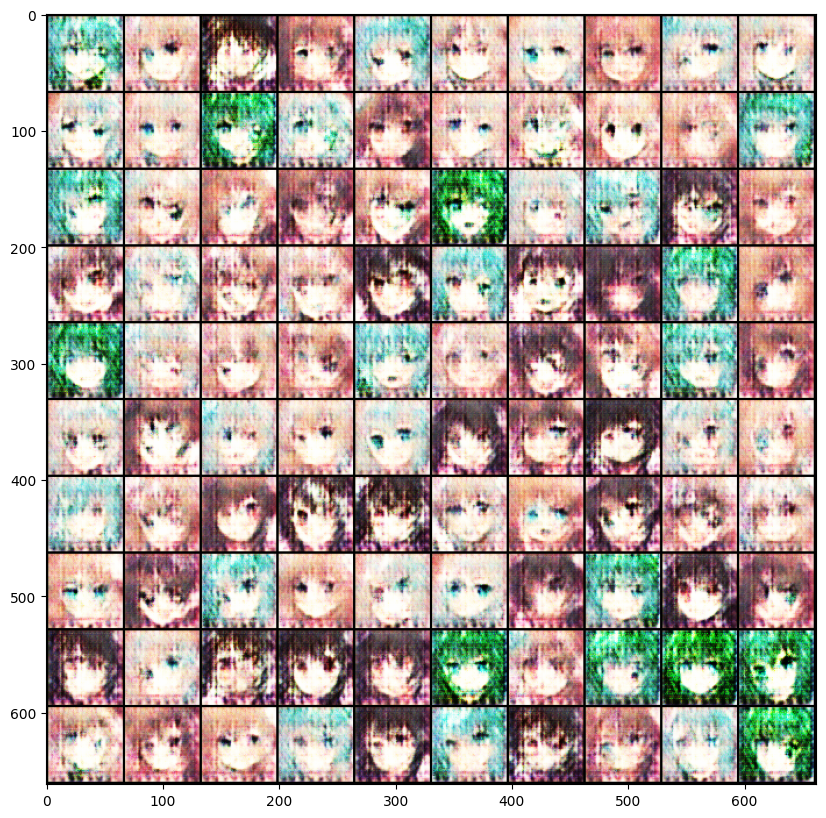

Epoch 3: 100%|██████████| 1115/1115 [01:26<00:00, 12.84it/s, loss_D=-11.3, loss_G=36.7]
2024-10-23 10:50 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_003.jpg.


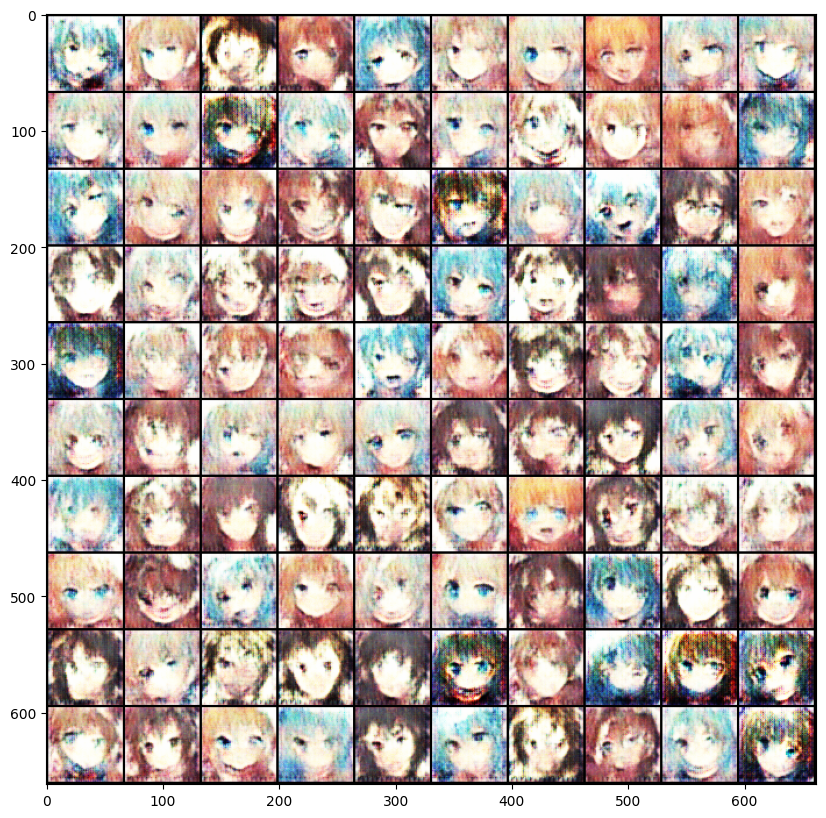

Epoch 4: 100%|██████████| 1115/1115 [01:25<00:00, 13.03it/s, loss_D=-9.22, loss_G=36.8]
2024-10-23 10:51 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_004.jpg.


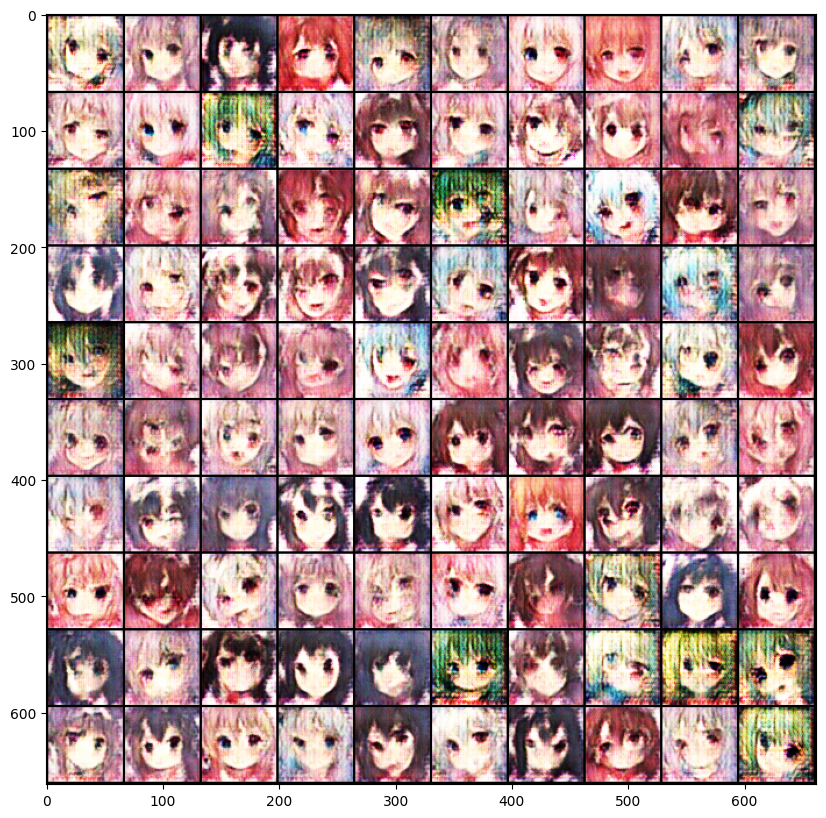

Epoch 5: 100%|██████████| 1115/1115 [01:24<00:00, 13.19it/s, loss_D=-10.9, loss_G=43.5]
2024-10-23 10:53 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_005.jpg.


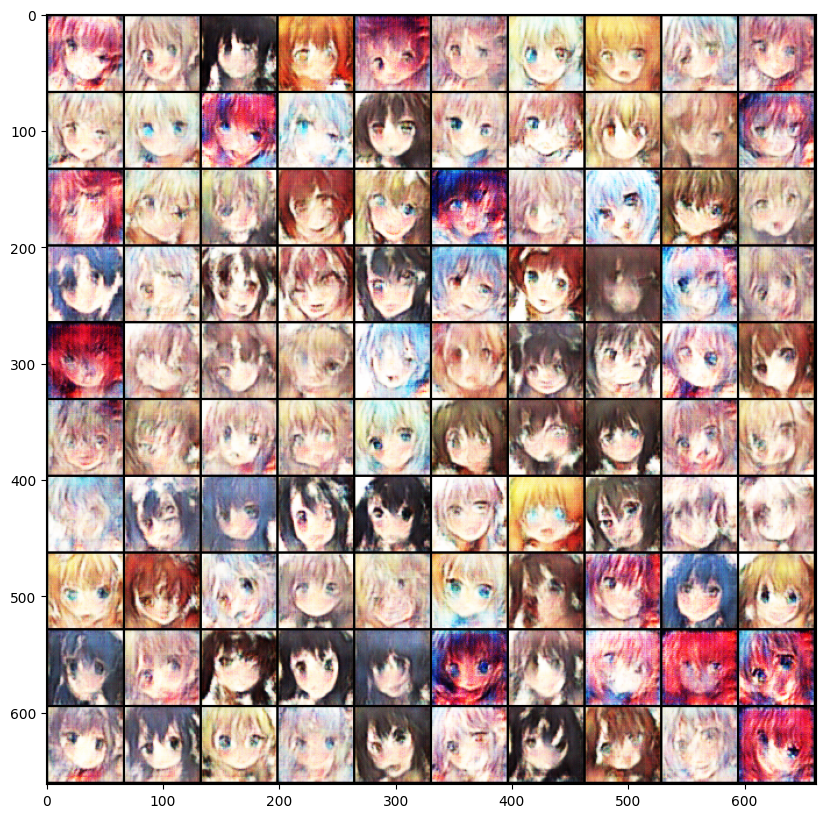

Epoch 6: 100%|██████████| 1115/1115 [01:23<00:00, 13.31it/s, loss_D=-9.92, loss_G=33.6]
2024-10-23 10:54 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_006.jpg.


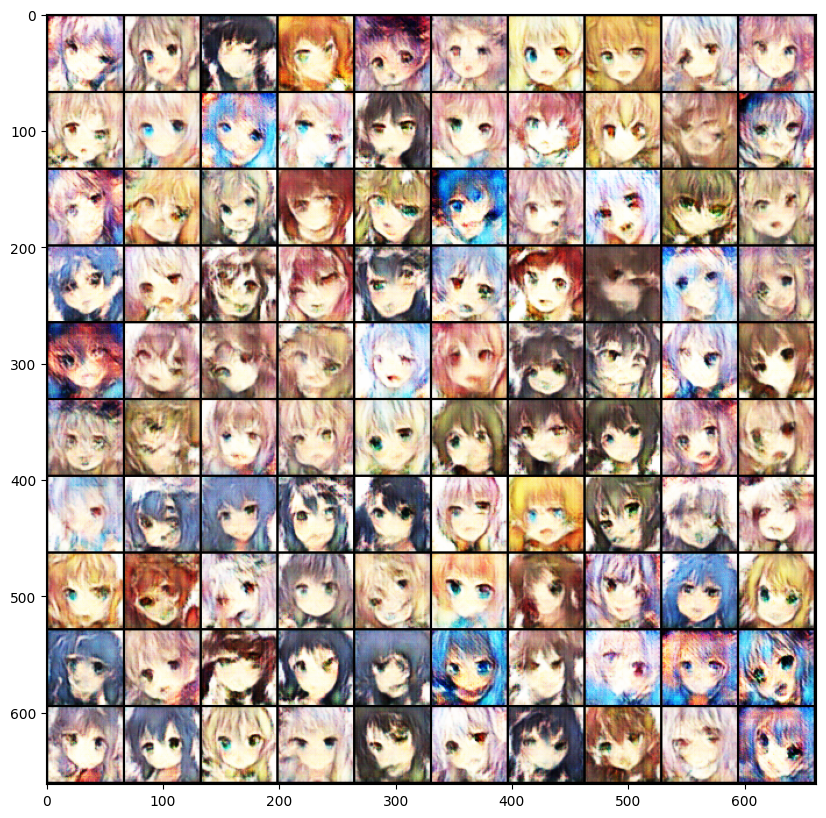

Epoch 7: 100%|██████████| 1115/1115 [01:24<00:00, 13.27it/s, loss_D=-6.62, loss_G=35.6]
2024-10-23 10:56 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_007.jpg.


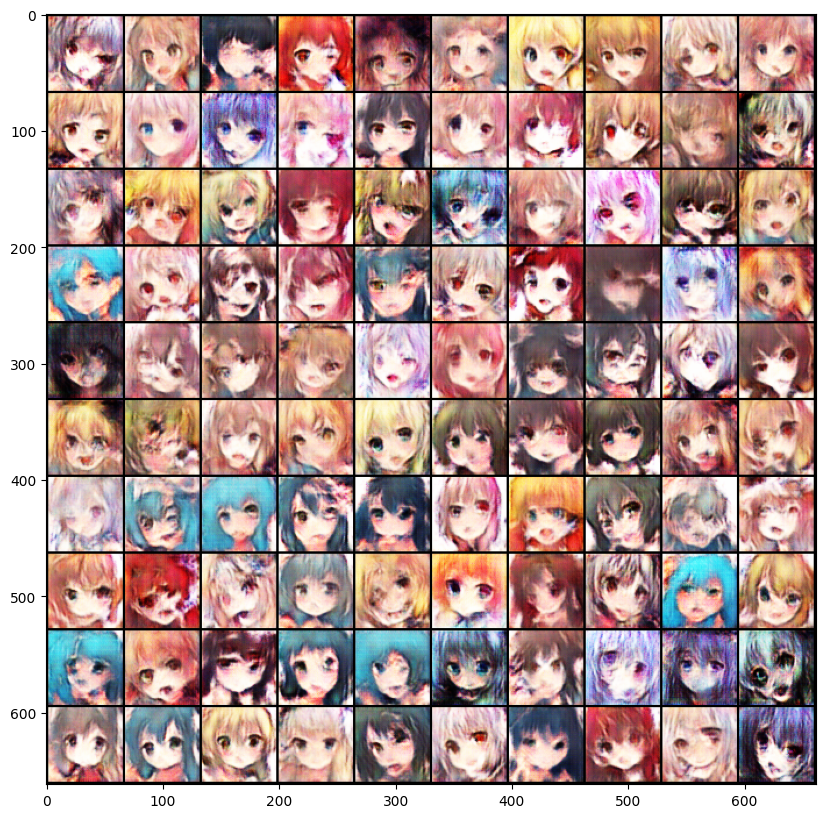

Epoch 8: 100%|██████████| 1115/1115 [01:24<00:00, 13.15it/s, loss_D=-5.38, loss_G=45.4]
2024-10-23 10:57 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_008.jpg.


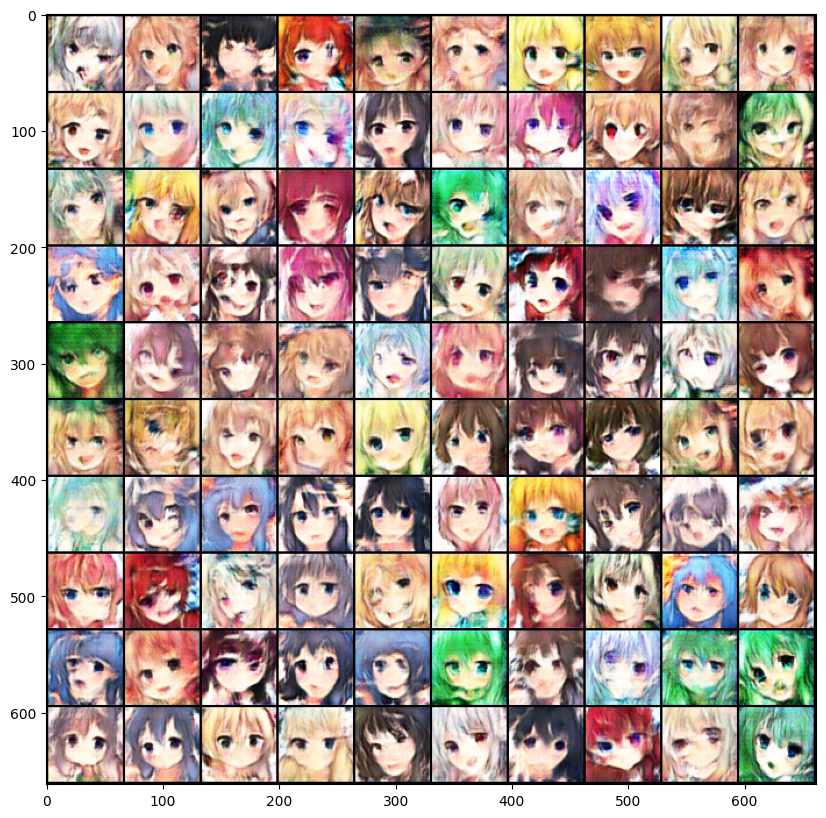

Epoch 9: 100%|██████████| 1115/1115 [01:24<00:00, 13.18it/s, loss_D=-5.93, loss_G=36.5]
2024-10-23 10:59 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_009.jpg.


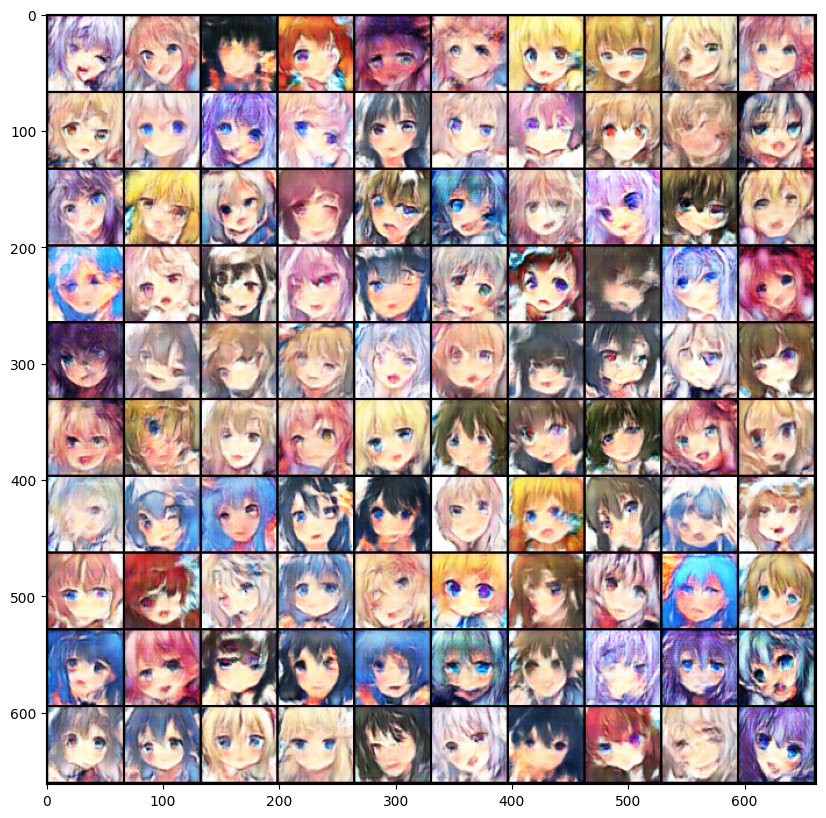

Epoch 10: 100%|██████████| 1115/1115 [01:23<00:00, 13.36it/s, loss_D=-6.73, loss_G=36.1]
2024-10-23 11:00 - INFO: Save some samples to .\logs\2024-10-23_10-42-53_GAN\Epoch_010.jpg.


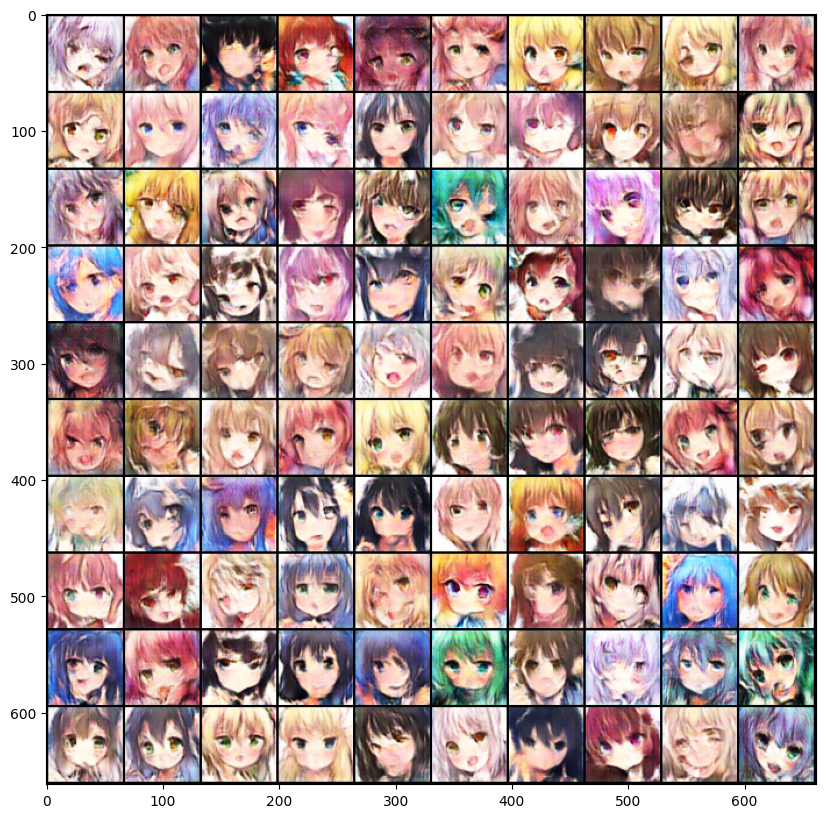

2024-10-23 11:00 - INFO: Finish training


In [10]:
trainer = TrainerGAN(config)
trainer.train()

# Inference
In this section, we will use trainer to train model

## Inference through trainer

In [13]:
# save the 1000 images into ./output folder
model_path = "./checkpoints/"+load_time+f'_GAN/G_{config["n_epoch"] - 1}.pth'
print(model_path)
trainer.inference(model_path) # you have to modify the path when running this line

./checkpoints/2024-10-23_10-42-53_GAN/G_9.pth


## Prepare .tar file for submission

In [14]:
%cd output
!tar -zcf ../submission.tgz *.jpg
%cd ..

e:\Learn\Lhy_Machine_Learning-main\2022-ML\06 Generation\output
e:\Learn\Lhy_Machine_Learning-main\2022-ML\06 Generation
